In [53]:
from transformers import Sam3Processor, Sam3Model, Sam3TrackerProcessor, Sam3TrackerModel, pipeline
from huggingface_hub import model_info
import torch
from PIL import Image
import requests
import numpy as np
import matplotlib
import matplotlib.colors as mcolors

from accelerate import Accelerator
import os

In [2]:
!hf auth login

User is already logged in.


In [4]:

#Nvidia GPU
#device = "cuda" if torch.cuda.is_available() else "cpu"
#Apple MPS
device = "mps" if torch.backends.mps.is_available() else "cpu"

#run this only once to download the model and processor
#model = Sam3Model.from_pretrained("facebook/sam3").to(device)

#Load model and processor
model = Sam3Model.from_pretrained("facebook/sam3")
processor = Sam3Processor.from_pretrained("facebook/sam3")

Loading weights:   0%|          | 0/1468 [00:00<?, ?it/s]

The OrderedVocab you are attempting to save contains holes for indices [1], your vocabulary could be corrupted !
The OrderedVocab you are attempting to save contains holes for indices [1], your vocabulary could be corrupted !


In [5]:
from huggingface_hub import model_info

info = model_info("facebook/sam3")
info

ModelInfo(id='facebook/sam3', author='facebook', sha='3c879f39826c281e95690f02c7821c4de09afae7', created_at=datetime.datetime(2025, 11, 7, 5, 17, 48, tzinfo=datetime.timezone.utc), last_modified=datetime.datetime(2025, 11, 20, 22, 5, 8, tzinfo=datetime.timezone.utc), private=False, disabled=False, downloads=326755, downloads_all_time=None, gated='manual', gguf=None, inference=None, inference_provider_mapping=None, likes=863, library_name='transformers', tags=['transformers', 'safetensors', 'sam3_video', 'feature-extraction', 'sam3', 'mask-generation', 'en', 'license:other', 'endpoints_compatible', 'region:us'], pipeline_tag='mask-generation', mask_token=None, card_data={'base_model': None, 'datasets': None, 'eval_results': None, 'language': ['en'], 'library_name': 'transformers', 'license': 'other', 'license_name': None, 'license_link': None, 'metrics': None, 'model_name': None, 'pipeline_tag': 'mask-generation', 'tags': ['sam3'], 'extra_gated_fields': {'First Name': 'text', 'Last Name

In [6]:
device

'mps'

In [14]:
bcn_zones = os.listdir('./data/StreetViews/BCN/')

In [18]:
images_array = []

for zone in bcn_zones:
    if zone==".DS_Store":
            continue
    image_files = os.listdir(f'./data/StreetViews/BCN/{zone}/')
    for image_file in image_files:
        if image_file==".DS_Store":
            continue
        image_path = f'./data/StreetViews/BCN/{zone}/{image_file}'
        image = Image.open(image_path).convert("RGB")
        images_array.append({"zone": zone,"name": image_file,"image": image})

In [21]:
len(images_array)

3545

In [68]:
import numpy as np
from PIL import Image
import matplotlib
import matplotlib.colors as mcolors

def overlay_masks(image, masks, cmap=None, color=None, alpha_factor=0.25):

    # Ensure only one mode is used
    if (cmap is None and color is None) or (cmap is not None and color is not None):
        raise ValueError("You must provide either cmap=... OR color=..., but not both.")

    image = image.convert("RGBA")

    masks = 255 * masks.cpu().numpy().astype(np.uint8)

    n_masks = masks.shape[0]

    if cmap is not None:
        # Check cmap exists
        if cmap not in matplotlib.colormaps:
            raise ValueError(f"Unknown colormap '{cmap}'")

        cm = matplotlib.colormaps.get_cmap(cmap).resampled(n_masks)
        colors_rgb = [
            tuple(int(c * 255) for c in cm(i / max(n_masks - 1, 1))[:3])
            for i in range(n_masks)
        ]

    else:  # SINGLE FIXED COLOR
        c = color
        if color not in mcolors.BASE_COLORS and color not in mcolors.CSS4_COLORS and not mcolors.is_color_like(color):
            raise ValueError(f"Unknown color '{c}'")
        r, g, b = mcolors.to_rgb(c)

        single_rgb = (int(r * 255), int(g * 255), int(b * 255))
        colors_rgb = [single_rgb] * n_masks


    for mask, rgb in zip(masks, colors_rgb):
        mask_img = Image.fromarray(mask)
        overlay = Image.new("RGBA", image.size, rgb + (0,))

        alpha = mask_img.point(lambda v: int(v * alpha_factor))
        overlay.putalpha(alpha)

        image = Image.alpha_composite(image, overlay)

    return image

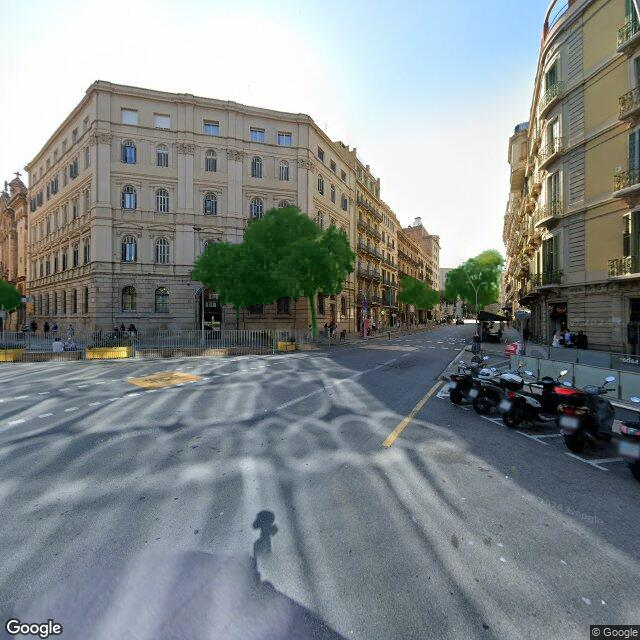

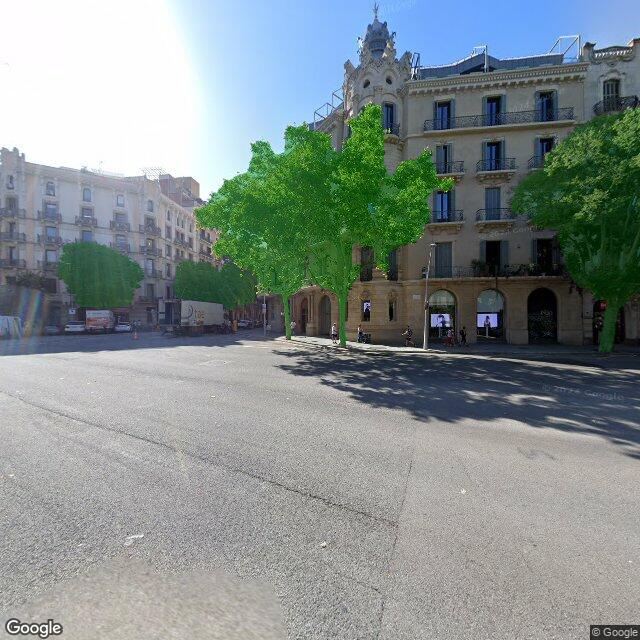

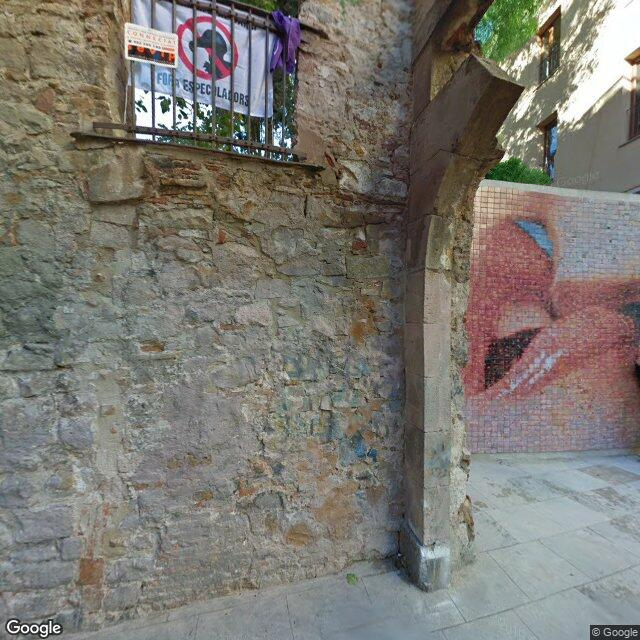

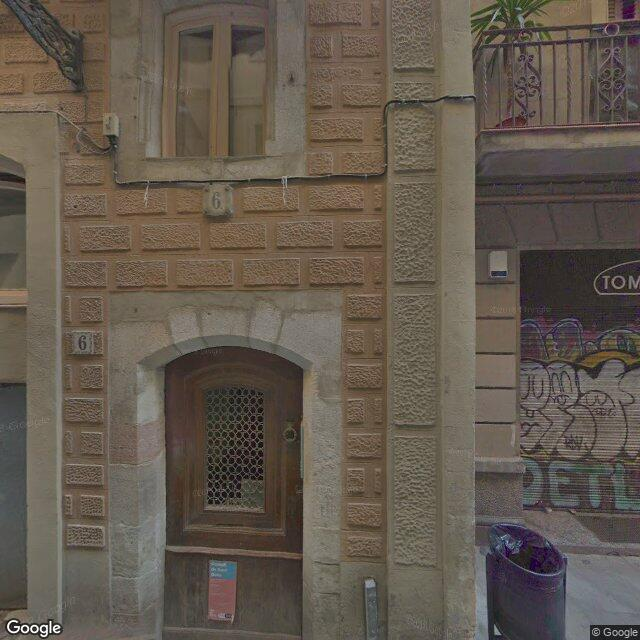

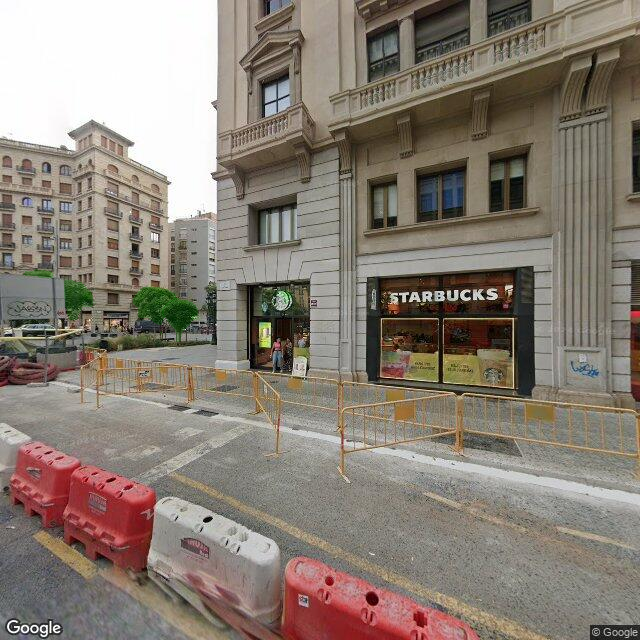

In [69]:
for i in range(5):
    image = images_array[i]["image"]
    inputs = processor(images=image, text="trees, plants and vegetation", return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)
    results = processor.post_process_instance_segmentation(
        outputs,
        threshold=0.5,
        mask_threshold=0.5,
        target_sizes=inputs.get("original_sizes").tolist()
    )[0]
    overlaid_image = overlay_masks(image, results["masks"], color="green")
    display(overlaid_image)

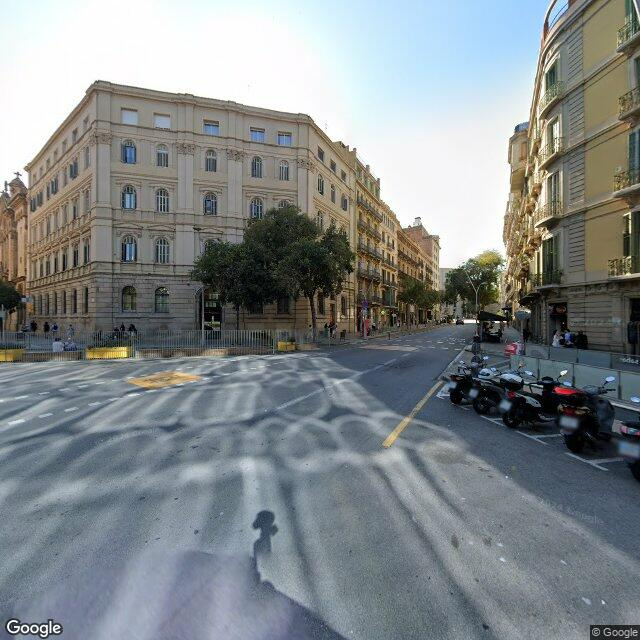

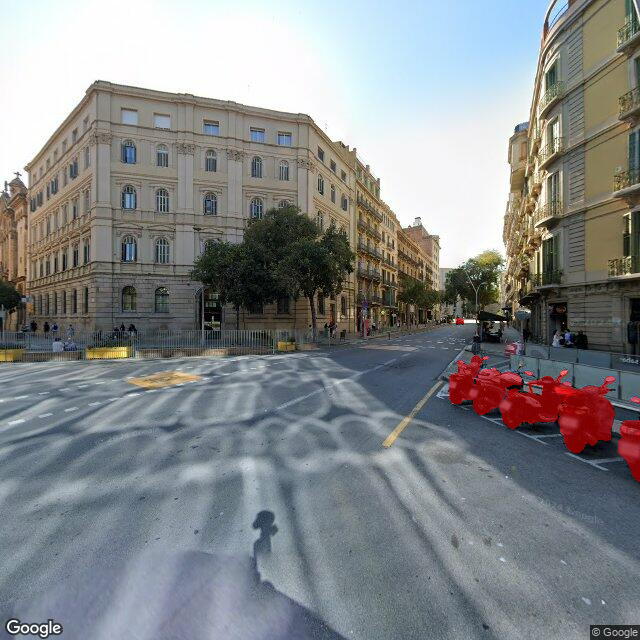

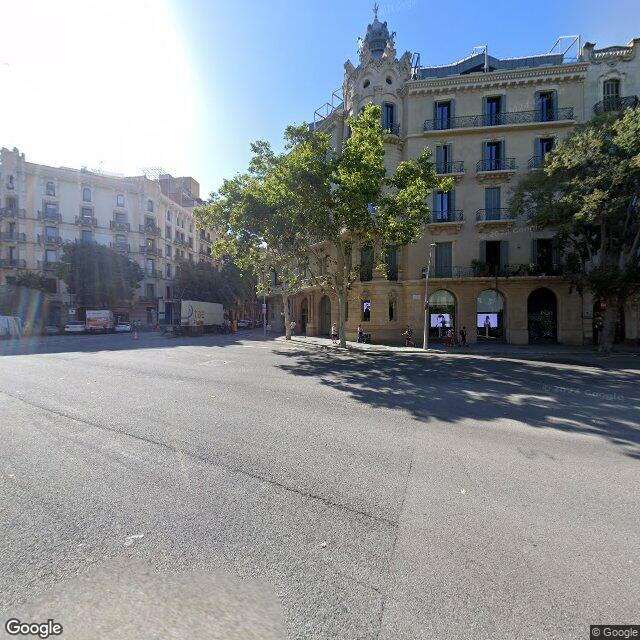

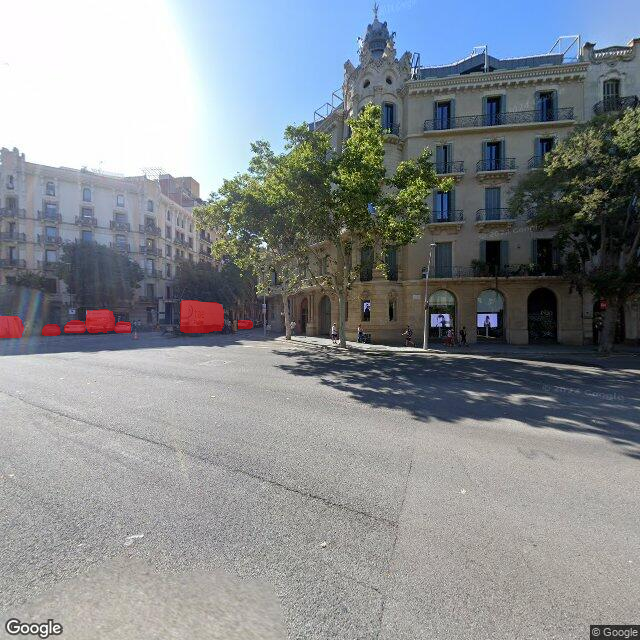

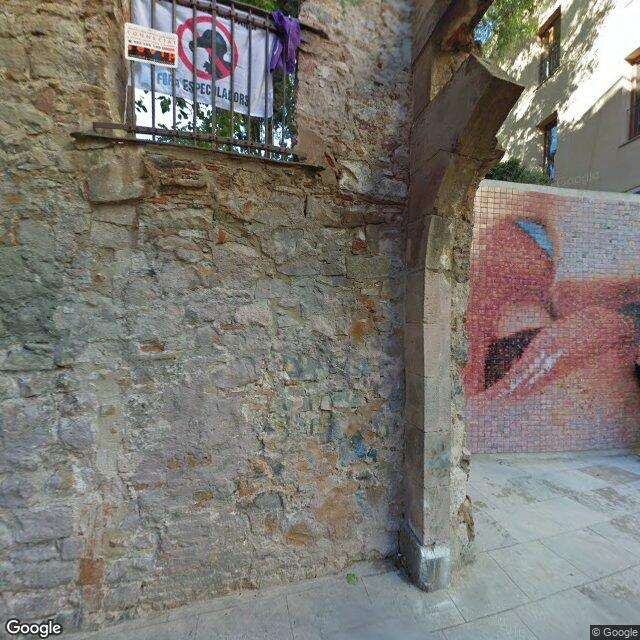

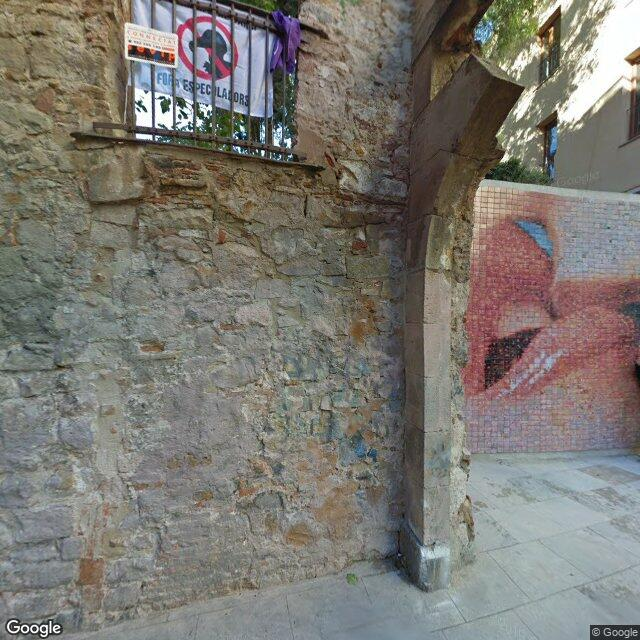

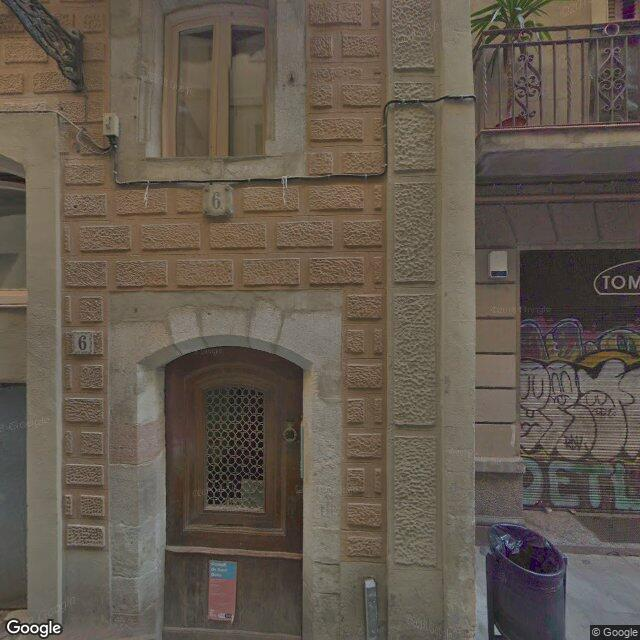

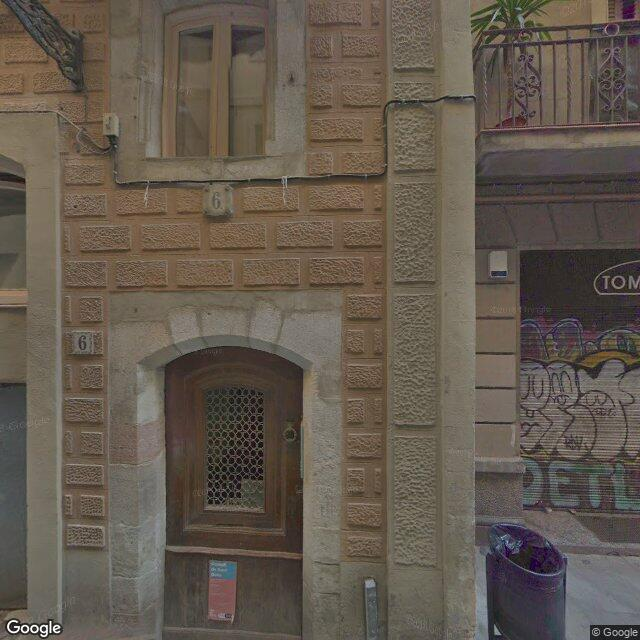

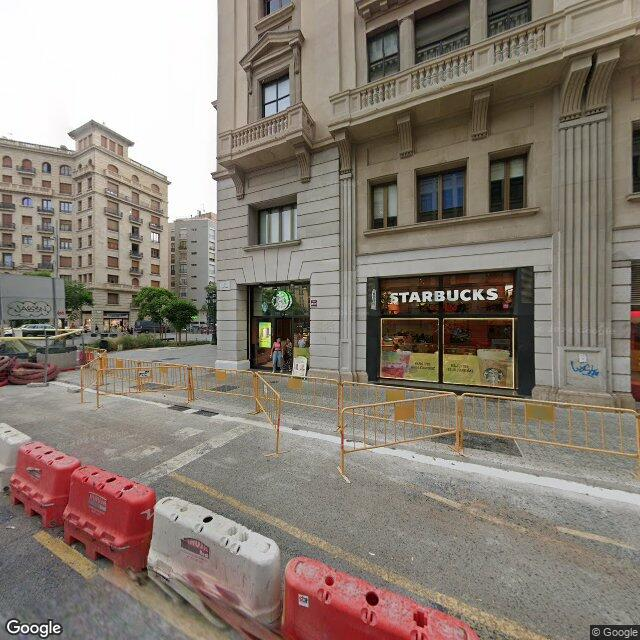

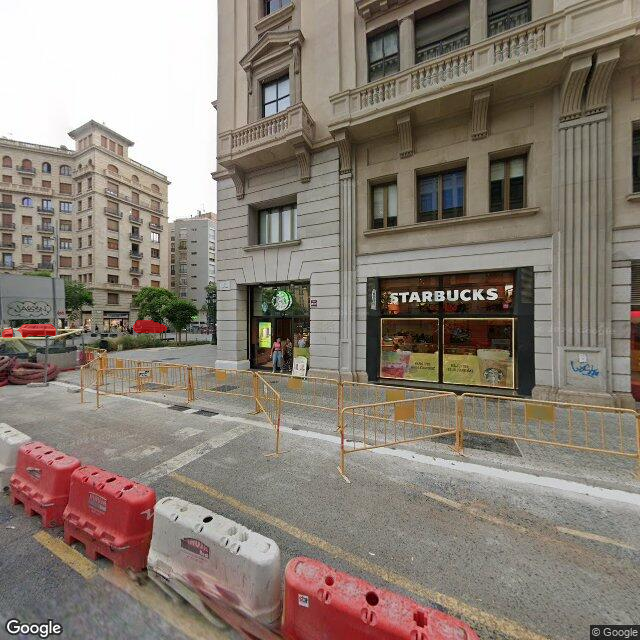

In [ ]:
for i in range(5):
    image = images_array[i]["image"]
    inputs = processor(images=image, text="vehicles", return_tensors="pt")
    with torch.no_grad():
        outputs = model(**inputs)
    results = processor.post_process_instance_segmentation(
        outputs,
        threshold=0.5,
        mask_threshold=0.5,
        target_sizes=inputs.get("original_sizes").tolist()
    )[0]
    overlaid_image = overlay_masks(image, results["masks"], color="red")
    display(image, overlaid_image)